<a href="https://colab.research.google.com/github/Yash-Shindey/DinoV2-Transformer/blob/main/DinoVision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q git+https://github.com/huggingface/transformers.git datasets


  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.8/547.8 kB 15.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.9/39.9 MB 20.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 14.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pyarrow<15.0.0a0,>=14.0.1, but you have pyarrow 17.0.0 which is incompatible.
google-colab 1.0.0 requires requests==2.31.0, but you have requests 2.32.3 which is incompatible.
ibis-fram

In [2]:
!pip install -q evaluate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 3.3 MB/s eta 0:00:00


In [3]:
from huggingface_hub import notebook_login

notebook_login()

In [43]:
from datasets import load_dataset

dataset = load_dataset("segments/sidewalk-semantic",split="train")

#You need to get access to use the dataset.

In [44]:
dataset

Dataset({
    features: ['pixel_values', 'label'],
    num_rows: 1000
})

In [8]:
dataset= dataset.train_test_split(test_size=0.2)
dataset

DatasetDict({
    train: Dataset({
        features: ['pixel_values', 'label'],
        num_rows: 800
    })
    test: Dataset({
        features: ['pixel_values', 'label'],
        num_rows: 200
    })
})

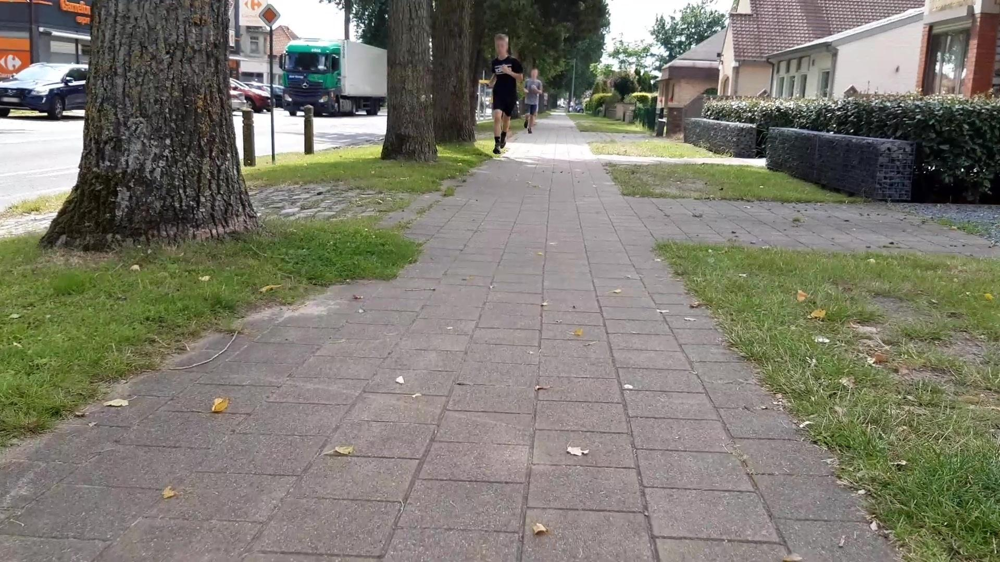

In [9]:
example = dataset["train"][0]
image = example["pixel_values"]
image

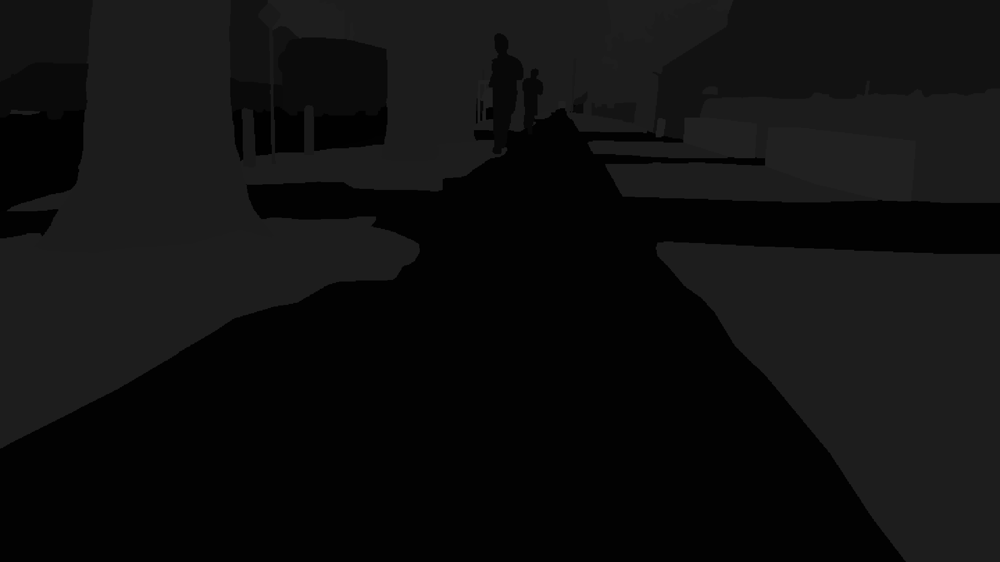

In [10]:
segmentation_map = example["label"]
segmentation_map

In [11]:
import numpy as np

segmentation_map = np.array(segmentation_map)
segmentation_map

array([[18, 18, 18, ..., 18, 18, 18],
       [18, 18, 18, ..., 18, 18, 18],
       [18, 18, 18, ..., 18, 18, 18],
       ...,
       [ 2,  2,  2, ..., 29, 29, 29],
       [ 2,  2,  2, ..., 29, 29, 29],
       [ 2,  2,  2, ..., 29, 29, 29]], dtype=uint8)

In [12]:
id2label= {0: "unlabeled",
1: "flat-road",
2: "flat-sidewalk",
3: "flat-crosswalk",
4: "flat-cyclinglane",
5: "flat-parkingdriveway",
6: "flat-railtrack",
7: "flat-curb",
8: "human-person",
9: "human-rider",
10: "vehicle-car",
11: "vehicle-truck",
12: "vehicle-bus",
13: "vehicle-tramtrain",
14: "vehicle-motorcycle",
15: "vehicle-bicycle",
16: "vehicle-caravan",
17: "vehicle-cartrailer",
18: "construction-building",
19: "construction-door",
20: "construction-wall",
21: "construction-fenceguardrail",
22: "construction-bridge",
23: "construction-tunnel",
24: "construction-stairs",
25: "object-pole",
26: "object-trafficsign",
27: "object-trafficlight",
28: "nature-vegetation",
29: "nature-terrain",
30: "sky",
31: "void-ground",
32: "void-dynamic",
33: "void-static",
34: "void-unclear"
}

In [13]:
print(id2label)
#just in case lol

{0: 'unlabeled', 1: 'flat-road', 2: 'flat-sidewalk', 3: 'flat-crosswalk', 4: 'flat-cyclinglane', 5: 'flat-parkingdriveway', 6: 'flat-railtrack', 7: 'flat-curb', 8: 'human-person', 9: 'human-rider', 10: 'vehicle-car', 11: 'vehicle-truck', 12: 'vehicle-bus', 13: 'vehicle-tramtrain', 14: 'vehicle-motorcycle', 15: 'vehicle-bicycle', 16: 'vehicle-caravan', 17: 'vehicle-cartrailer', 18: 'construction-building', 19: 'construction-door', 20: 'construction-wall', 21: 'construction-fenceguardrail', 22: 'construction-bridge', 23: 'construction-tunnel', 24: 'construction-stairs', 25: 'object-pole', 26: 'object-trafficsign', 27: 'object-trafficlight', 28: 'nature-vegetation', 29: 'nature-terrain', 30: 'sky', 31: 'void-ground', 32: 'void-dynamic', 33: 'void-static', 34: 'void-unclear'}


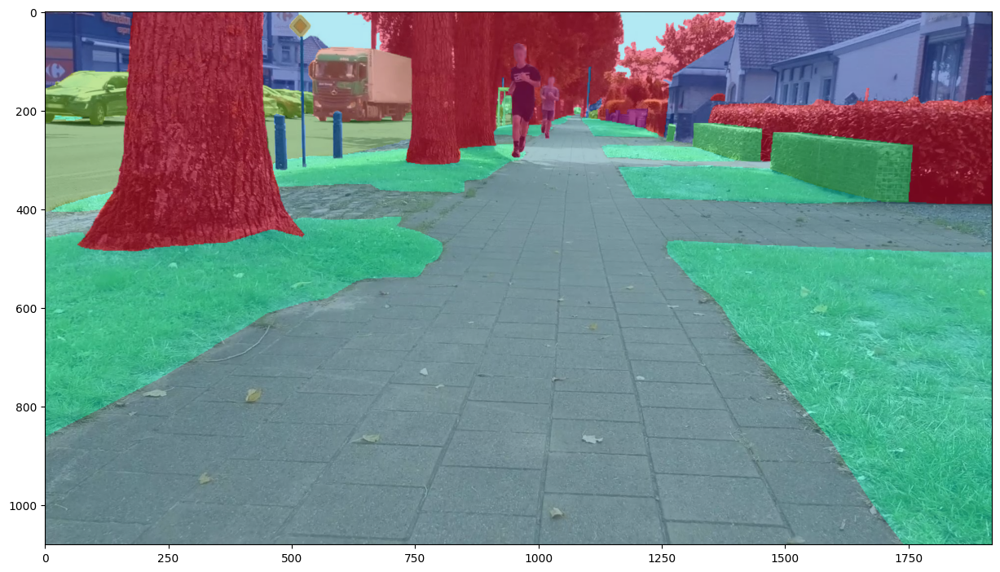

In [14]:
import numpy as np
import matplotlib.pyplot as plt

# map every class to a random color
id2color = {k: list(np.random.choice(range(256), size=3)) for k,v in id2label.items()}

def visualize_map(image, segmentation_map):
    color_seg = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
    for label, color in id2color.items():
        color_seg[segmentation_map == label, :] = color

    # Show image + mask
    img = np.array(image) * 0.5 + color_seg * 0.5
    img = img.astype(np.uint8)

    plt.figure(figsize=(15, 10))
    plt.imshow(img)
    plt.show()

visualize_map(image, segmentation_map)


In [15]:
from torch.utils.data import Dataset
import torch

class SegmentationDataset(Dataset):
  def __init__(self, dataset, transform):
    self.dataset = dataset
    self.transform = transform

  def __len__(self):
    return len(self.dataset)

  def __getitem__(self, idx):
    item = self.dataset[idx]
    original_image = np.array(item["pixel_values"])
    original_segmentation_map = np.array(item["label"])

    transformed = self.transform(image=original_image, mask=original_segmentation_map)
    image, target = torch.tensor(transformed['image']), torch.LongTensor(transformed['mask'])

    # convert to C, H, W
    image = image.permute(2,0,1)

    return image, target, original_image, original_segmentation_map


In [16]:
import albumentations as A

ADE_MEAN = np.array([123.675, 116.280, 103.530]) / 255
ADE_STD = np.array([58.395, 57.120, 57.375]) / 255

train_transform = A.Compose([
    # hadded an issue with an image being too small to crop, PadIfNeeded didn't help...
    # if anyone knows why this is happening I'm happy to read why
    # A.PadIfNeeded(min_height=448, min_width=448),
    # A.RandomResizedCrop(height=448, width=448),
    A.Resize(width=448, height=448),
    A.HorizontalFlip(p=0.5),
    A.Normalize(mean=ADE_MEAN, std=ADE_STD),
])

val_transform = A.Compose([
    A.Resize(width=448, height=448),
    A.Normalize(mean=ADE_MEAN, std=ADE_STD),

])

train_dataset = SegmentationDataset(dataset["train"], transform=train_transform)
val_dataset = SegmentationDataset(dataset["test"], transform=val_transform)

In [17]:
pixel_values, target, original_image, original_segmentation_map = train_dataset[3]
print(pixel_values.shape)
print(target.shape)

torch.Size([3, 448, 448])
torch.Size([448, 448])


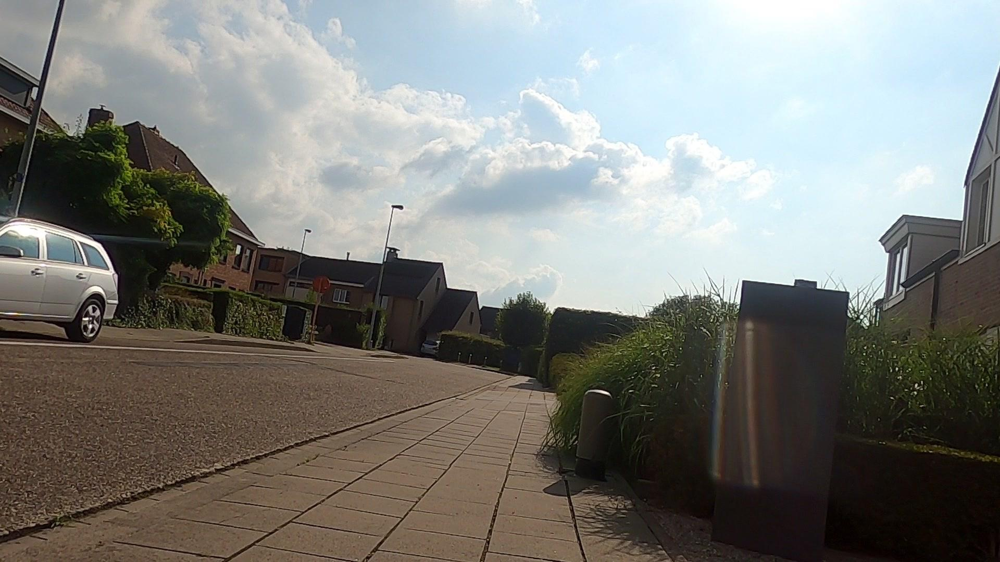

In [18]:
from PIL import Image

Image.fromarray(original_image)

In [19]:
[id2label[id] for id in np.unique(original_segmentation_map).tolist()]


['flat-road',
 'flat-sidewalk',
 'flat-parkingdriveway',
 'flat-curb',
 'vehicle-car',
 'construction-building',
 'object-pole',
 'nature-vegetation',
 'nature-terrain',
 'sky',
 'void-static']

In [20]:
from torch.utils.data import DataLoader

def collate_fn(inputs):
    batch = dict()
    batch["pixel_values"] = torch.stack([i[0] for i in inputs], dim=0)
    batch["labels"] = torch.stack([i[1] for i in inputs], dim=0)
    batch["original_images"] = [i[2] for i in inputs]
    batch["original_segmentation_maps"] = [i[3] for i in inputs]

    return batch

train_dataloader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=collate_fn)
val_dataloader = DataLoader(val_dataset, batch_size=4, shuffle=False, collate_fn=collate_fn)


In [22]:
batch = next(iter(train_dataloader))
for k,v in batch.items():
  if isinstance(v,torch.Tensor):
    print(k,v.shape)

pixel_values torch.Size([4, 3, 448, 448])
labels torch.Size([4, 448, 448])


In [23]:
batch["pixel_values"].dtype

torch.float32

In [24]:
batch["labels"].dtype


torch.int64

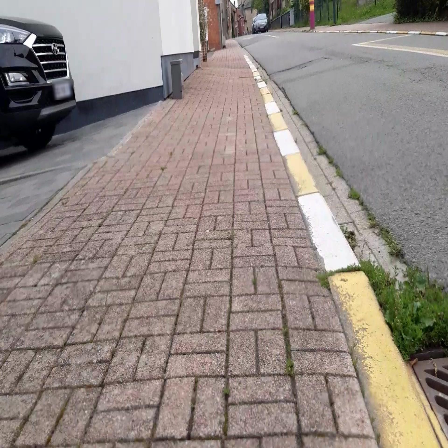

In [25]:
from PIL import Image

unnormalized_image = (batch["pixel_values"][0].numpy() * np.array(ADE_STD)[:, None, None]) + np.array(ADE_MEAN)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
unnormalized_image = Image.fromarray(unnormalized_image)
unnormalized_image

In [26]:
[id2label[id] for id in torch.unique(batch["labels"][0]).tolist()]

['flat-road',
 'flat-sidewalk',
 'flat-parkingdriveway',
 'flat-curb',
 'vehicle-car',
 'construction-building',
 'construction-wall',
 'construction-fenceguardrail',
 'object-pole',
 'nature-vegetation',
 'sky',
 'void-static']

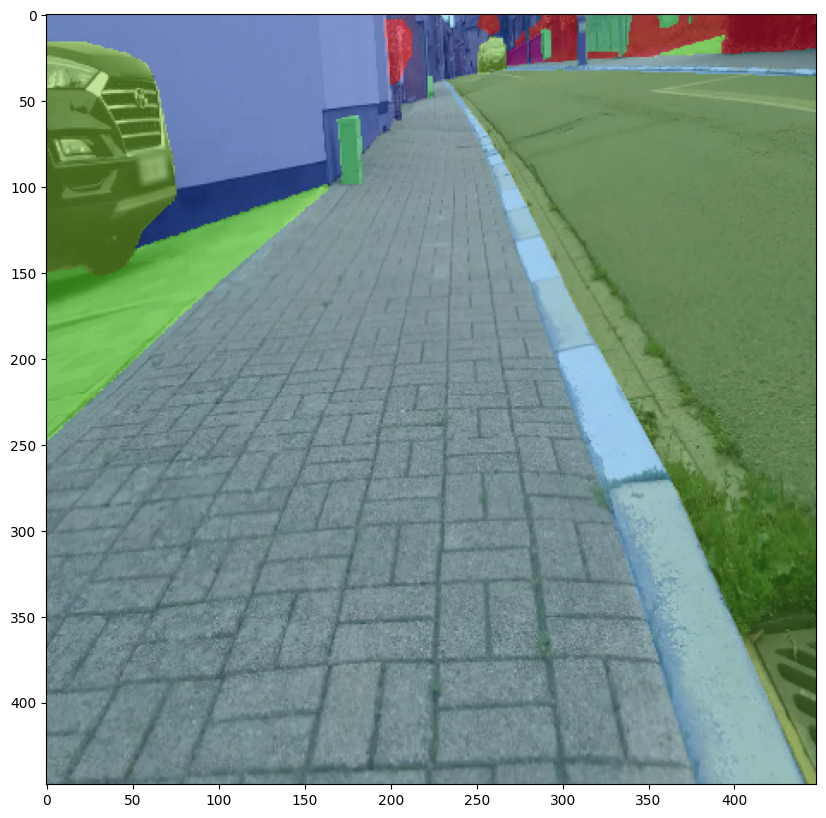

In [27]:
visualize_map(unnormalized_image, batch["labels"][0].numpy())


### Model Definition + Linear Classifier

In [28]:
import torch
from transformers import Dinov2Model, Dinov2PreTrainedModel
from transformers.modeling_outputs import SemanticSegmenterOutput

class LinearClassifier(torch.nn.Module):
    def __init__(self, in_channels, tokenW=32, tokenH=32, num_labels=1):
        super(LinearClassifier, self).__init__()

        self.in_channels = in_channels
        self.width = tokenW
        self.height = tokenH
        self.classifier = torch.nn.Conv2d(in_channels, num_labels, (1,1))

    def forward(self, embeddings):
        embeddings = embeddings.reshape(-1, self.height, self.width, self.in_channels)
        embeddings = embeddings.permute(0,3,1,2)

        return self.classifier(embeddings)


class Dinov2ForSemanticSegmentation(Dinov2PreTrainedModel):
  def __init__(self, config):
    super().__init__(config)

    self.dinov2 = Dinov2Model(config)
    self.classifier = LinearClassifier(config.hidden_size, 32, 32, config.num_labels)

  def forward(self, pixel_values, output_hidden_states=False, output_attentions=False, labels=None):
    # use frozen features
    outputs = self.dinov2(pixel_values,
                            output_hidden_states=output_hidden_states,
                            output_attentions=output_attentions)
    # get the patch embeddings - so we exclude the CLS token
    patch_embeddings = outputs.last_hidden_state[:,1:,:]

    # convert to logits and upsample to the size of the pixel values
    logits = self.classifier(patch_embeddings)
    logits = torch.nn.functional.interpolate(logits, size=pixel_values.shape[2:], mode="bilinear", align_corners=False)

    loss = None
    if labels is not None:
      # important: we're going to use 0 here as ignore index instead of the default -100
      # as we don't want the model to learn to predict background
      loss_fct = torch.nn.CrossEntropyLoss(ignore_index=0)
      loss = loss_fct(logits.squeeze(), labels.squeeze())

    return SemanticSegmenterOutput(
        loss=loss,
        logits=logits,
        hidden_states=outputs.hidden_states,
        attentions=outputs.attentions,
    )

In [29]:
model = Dinov2ForSemanticSegmentation.from_pretrained("facebook/dinov2-base", id2label=id2label, num_labels=len(id2label))

config.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of Dinov2ForSemanticSegmentation were not initialized from the model checkpoint at facebook/dinov2-base and are newly initialized: ['classifier.classifier.bias', 'classifier.classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [30]:
for name, param in model.named_parameters():
  if name.startswith("dinov2"):
    param.requires_grad = False

In [31]:
outputs = model(pixel_values=batch["pixel_values"], labels=batch["labels"])
print(outputs.logits.shape)
print(outputs.loss)

torch.Size([4, 35, 448, 448])
tensor(4.1613, grad_fn=<NllLoss2DBackward0>)


In [32]:
import evaluate

metric = evaluate.load("mean_iou")

In [33]:

from torch.optim import AdamW
from tqdm.auto import tqdm

# training hyperparameters
# NOTE: I've just put some random ones here, not optimized at all
# feel free to experiment, see also DINOv2 paper
learning_rate = 5e-5
epochs = 10

optimizer = AdamW(model.parameters(), lr=learning_rate)

# put model on GPU (set runtime to GPU in Google Colab)
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

# put model in training mode
model.train()

for epoch in range(epochs):
  print("Epoch:", epoch)
  for idx, batch in enumerate(tqdm(train_dataloader)):
      pixel_values = batch["pixel_values"].to(device)
      labels = batch["labels"].to(device)

      # forward pass
      outputs = model(pixel_values, labels=labels)
      loss = outputs.loss

      loss.backward()
      optimizer.step()

      # zero the parameter gradients
      optimizer.zero_grad()

      # evaluate
      with torch.no_grad():
        predicted = outputs.logits.argmax(dim=1)

        # note that the metric expects predictions + labels as numpy arrays
        metric.add_batch(predictions=predicted.detach().cpu().numpy(), references=labels.detach().cpu().numpy())

      # let's print loss and metrics every 100 batches
      if idx % 50 == 0:
        metrics = metric.compute(num_labels=len(id2label),
                                ignore_index=0,
                                reduce_labels=False,
        )

        print("Loss:", loss.item())
        print("Mean_iou:", metrics["mean_iou"])
        print("Mean accuracy:", metrics["mean_accuracy"])

Epoch: 0


  0%|          | 0/200 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/datasets/features/image.py:348: UserWarning: Downcasting array dtype int64 to int32 to be compatible with 'Pillow'
  warnings.warn(f"Downcasting array dtype {dtype} to {dest_dtype} to be compatible with 'Pillow'")
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/9e450724f21f05592bfb0255fe2fa576df8171fa060d11121d8aecfff0db80d0/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


Loss: 4.151943683624268
Mean_iou: 0.003526815957114016
Mean accuracy: 0.013897840782754535
Loss: 2.7127931118011475
Mean_iou: 0.023750947080112238
Mean accuracy: 0.044689318203560854
Loss: 2.3006157875061035
Mean_iou: 0.07042313303232174
Mean accuracy: 0.12222995945333229
Loss: 1.3259831666946411
Mean_iou: 0.09655340093323002
Mean accuracy: 0.15002366846334786
Epoch: 1


  0%|          | 0/200 [00:00<?, ?it/s]

Loss: 1.3264317512512207
Mean_iou: 0.11658453874932008
Mean accuracy: 0.17550101677839608
Loss: 1.4605985879898071
Mean_iou: 0.1394747366896779
Mean accuracy: 0.1978309722636663
Loss: 1.149082899093628
Mean_iou: 0.14464957785852853
Mean accuracy: 0.20461203490574376


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/9e450724f21f05592bfb0255fe2fa576df8171fa060d11121d8aecfff0db80d0/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union


Loss: 1.2270654439926147
Mean_iou: 0.1643799201474112
Mean accuracy: 0.22281032453170002
Epoch: 2


  0%|          | 0/200 [00:00<?, ?it/s]

Loss: 1.0086138248443604
Mean_iou: 0.17093924667110932
Mean accuracy: 0.24291778500354666
Loss: 0.8813501596450806
Mean_iou: 0.19692765191687697
Mean accuracy: 0.25808762970850935
Loss: 0.9257653951644897
Mean_iou: 0.19610732743189854
Mean accuracy: 0.2516916230350143
Loss: 0.8566468954086304
Mean_iou: 0.1959542898055218
Mean accuracy: 0.27436712725447837
Epoch: 3


  0%|          | 0/200 [00:00<?, ?it/s]

Loss: 0.9000178575515747
Mean_iou: 0.2139691589815905
Mean accuracy: 0.2702396595920358
Loss: 1.0522419214248657
Mean_iou: 0.23652457796845958
Mean accuracy: 0.2956162197217136
Loss: 0.7397560477256775
Mean_iou: 0.2281560570064696
Mean accuracy: 0.29625361628452296
Loss: 0.5378731489181519
Mean_iou: 0.2489381312820096
Mean accuracy: 0.30615033432765115
Epoch: 4


  0%|          | 0/200 [00:00<?, ?it/s]

Loss: 0.6765849590301514
Mean_iou: 0.24826874606272892
Mean accuracy: 0.32502946736641675
Loss: 0.7111393213272095
Mean_iou: 0.2616061415328465
Mean accuracy: 0.33682738495043385
Loss: 0.8024386763572693
Mean_iou: 0.2741919241428271
Mean accuracy: 0.330070675743128
Loss: 0.5335207581520081
Mean_iou: 0.26426253724423476
Mean accuracy: 0.323647318166387
Epoch: 5


  0%|          | 0/200 [00:00<?, ?it/s]

Loss: 0.5805720090866089
Mean_iou: 0.2696989815891214
Mean accuracy: 0.33954505984372507
Loss: 0.7377568483352661
Mean_iou: 0.2847048655625955
Mean accuracy: 0.3582097319654607
Loss: 0.5280210971832275
Mean_iou: 0.29077515030367407
Mean accuracy: 0.3599069315109162
Loss: 0.42845669388771057
Mean_iou: 0.28845288326129825
Mean accuracy: 0.3542261057035062
Epoch: 6


  0%|          | 0/200 [00:00<?, ?it/s]

Loss: 0.6587958931922913
Mean_iou: 0.30672829736871504
Mean accuracy: 0.3876562222721133
Loss: 0.7217241525650024
Mean_iou: 0.3200667860051306
Mean accuracy: 0.3851077591180515
Loss: 0.6316805481910706
Mean_iou: 0.3005541211149962
Mean accuracy: 0.3778248328193082
Loss: 0.5922924876213074
Mean_iou: 0.301272131626791
Mean accuracy: 0.37142791334429004
Epoch: 7


  0%|          | 0/200 [00:00<?, ?it/s]

Loss: 0.45837071537971497
Mean_iou: 0.3016863856108872
Mean accuracy: 0.3663015422618031
Loss: 0.5890652537345886
Mean_iou: 0.2989416597089462
Mean accuracy: 0.3750517364372566
Loss: 0.5503944158554077
Mean_iou: 0.3234488124266056
Mean accuracy: 0.39122543507025526
Loss: 0.6058387756347656
Mean_iou: 0.33273712830979096
Mean accuracy: 0.4025712022097607
Epoch: 8


  0%|          | 0/200 [00:00<?, ?it/s]

Loss: 0.5274167656898499
Mean_iou: 0.3288017057674338
Mean accuracy: 0.39889741397426237
Loss: 0.6403188109397888
Mean_iou: 0.31401681125323977
Mean accuracy: 0.3917684071818684
Loss: 0.5231480598449707
Mean_iou: 0.33071617953696075
Mean accuracy: 0.40143345306711586
Loss: 0.4653943181037903
Mean_iou: 0.33632654398234557
Mean accuracy: 0.4047057445572819
Epoch: 9


  0%|          | 0/200 [00:00<?, ?it/s]

Loss: 0.45929187536239624
Mean_iou: 0.3265003819218889
Mean accuracy: 0.39452068884011465
Loss: 0.5991649627685547
Mean_iou: 0.3383115204919436
Mean accuracy: 0.41336774507726654
Loss: 0.9280517101287842
Mean_iou: 0.3531197449784096
Mean accuracy: 0.4244429135175627
Loss: 0.4918353855609894
Mean_iou: 0.3664350023250497
Mean accuracy: 0.44124134185114977


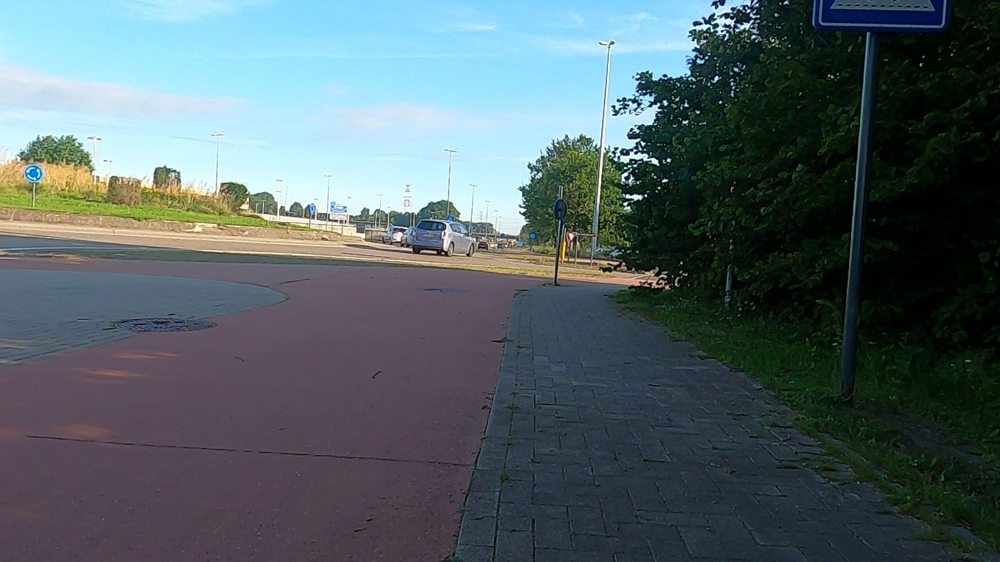

In [34]:
from PIL import Image

test_image = dataset["test"][10]["pixel_values"]
test_image

In [35]:
pixel_values = val_transform(image=np.array(test_image))["image"]
pixel_values = torch.tensor(pixel_values)
pixel_values = pixel_values.permute(2,0,1).unsqueeze(0) # convert to (batch_size, num_channels, height, width)
print(pixel_values.shape)

torch.Size([1, 3, 448, 448])


In [40]:
with torch.no_grad():
  outputs = model(pixel_values.to(device))

In [41]:
upsampled_logits = torch.nn.functional.interpolate(outputs.logits,
                                                   size=test_image.size[::-1],
                                                   mode="bilinear", align_corners=False)
predicted_map = upsampled_logits.argmax(dim=1)

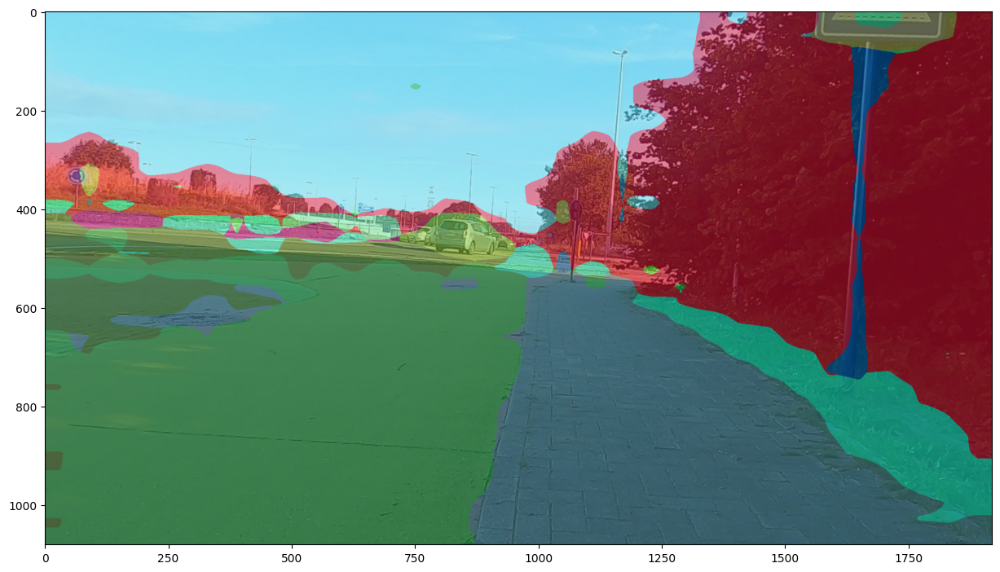

In [42]:
visualize_map(test_image, predicted_map.squeeze().cpu())
